## Локальные дескрипторы изображений и построение панорам
##### Автор: [Радослав Нейчев](https://www.linkedin.com/in/radoslav-neychev/), https://t.me/s/girafe_ai

**Примечание: т.к. библиотеки регулярно обновляются, для успешного прохождения тестов рекомендуем поставить opencv версии 4.11, иначе некоторые asssert'ы могут не пройти.**

In [1]:
# do not change the code in the block below
# __________start of block__________
import json
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
import cv2
import random
import glob
import torch

import numpy as np

from skimage import io # for io.imread
from IPython.display import clear_output
from matplotlib import pyplot as plt
from matplotlib import colors # ploting

# __________end of block__________

In [2]:

# do not change the code in the block below
# __________start of block__________
def imshow(images, titles, nrows = 0, ncols=0, figsize = (15,20)):
    """Plot a multiple images with titles.

    Parameters
    ----------
    images : image list
    titles : title list
    ncols : number of columns of subplots wanted in the display
    nrows : number of rows of subplots wanted in the figure
    """

    if ncols == 0 and nrows == 0:
      ncols = len(images)
      nrows = 1
    if ncols == 0:
      ncols = len(images) // nrows
    if nrows == 0:
      nrows = len(images) // ncols

    fig, axeslist = plt.subplots(ncols=ncols, nrows=nrows, squeeze=False, figsize = figsize)
    for i, image in enumerate(images):
        axeslist.ravel()[i].imshow(image, cmap=plt.gray(), vmin=0, vmax=255)
        axeslist.ravel()[i].set_title(titles[i])
        axeslist.ravel()[i].set_axis_off()
    plt.tight_layout() # optional
# __________end of block__________

In [3]:
'''if not os.path.exists('./images'):
    os.mkdir('./images')
else:
    print('folder `images` is present, passing')

!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example1_1.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example1_2.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example2_1.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example2_2.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example3_1.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example3_2.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example4_1.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example4_2.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example5_1.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example5_2.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example6_1.jpeg
!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example6_2.jpeg
!move ./example*.jpeg images'''

"if not os.path.exists('./images'):\n    os.mkdir('./images')\nelse:\n    print('folder `images` is present, passing')\n\n!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example1_1.jpeg\n!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example1_2.jpeg\n!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example2_1.jpeg\n!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example2_2.jpeg\n!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example3_1.jpeg\n!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/images/example3_2.jpeg\n!curl -O https://raw.githubuserc

In [4]:
'''!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/keypoints_sift.json'''

'!curl -O https://raw.githubusercontent.com/girafe-ai/ml-course/refs/heads/25s_ml_trainings_3/homeworks/hw03_panorama/keypoints_sift.json'

In [5]:
# do not change the code in the block below
# __________start of block__________
# Create a dictionary to store images with the same prefix
image_dict = {}

# Read all images and group them by prefix
for filename in sorted(glob.glob('./images/*.jpeg')):
    name = os.path.basename(filename)
    prefix = name.split('_')[0]  # Get prefix before first underscore
    
    # Load the image
    img = io.imread(filename)
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Add to dictionary
    if prefix in image_dict:
        image_dict[prefix].append((img))
    else:
        image_dict[prefix] = [(img)]
# __________end of block__________

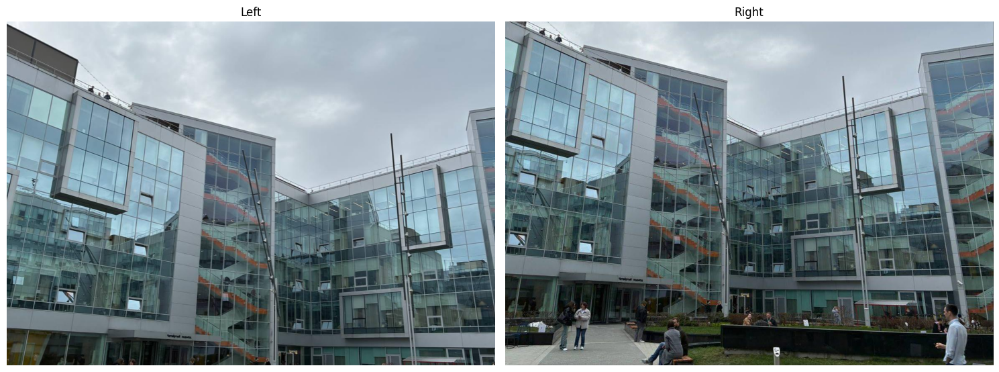

In [6]:
# do not change the code in the block below
# __________start of block__________
image1, image2 = image_dict['example2']
imshow( [image1, image2], ['Left', 'Right'])
# __________end of block__________

## Шаг 1: Создание панорамы вручную
Подберите сдвиг по координатам X и Y (`tx` и `ty` соответственно) для второго изобаражения относительно первого для задания оптимальной трансляции (смещения) для совмещения изображений вручную. Изображения имеют размеры, приведенные ниже:

In [7]:
print(f"first image shape: {image1.shape}, second image shape: {image2.shape}")

first image shape: (822, 1169, 3), second image shape: (822, 1167, 3)


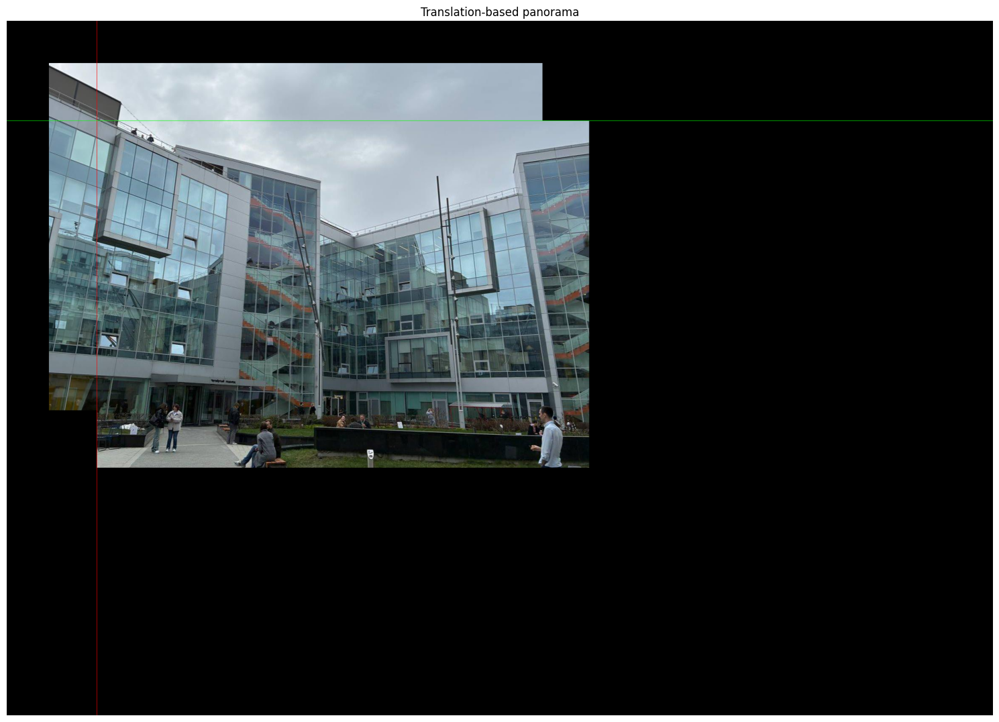

In [8]:
X_SHIFT = 100
Y_SHIFT = 100 # so you can have negative tx and ty 
tx = 113 # YOUR CODE HERE
ty = 136 # YOUR CODE HERE

assert tx + X_SHIFT >= 0
assert ty + Y_SHIFT >= 0

size = (image1.shape[0] + image2.shape[0], image1.shape[1] + image2.shape[1], 3)
image_trans = np.uint8(np.zeros(size))

# put image 1 on resulting image
image_trans[Y_SHIFT:Y_SHIFT+image1.shape[0], X_SHIFT:X_SHIFT+image1.shape[1], :] = image1

# put image 2 on resulting image
image_trans[Y_SHIFT+ty:Y_SHIFT+ty+image2.shape[0], X_SHIFT+tx:X_SHIFT+tx+image2.shape[1], :] = image2

# #add vertical line where two images are joined, use red color
image_trans[:, X_SHIFT+tx, :] = [255, 0, 0]
image_trans[Y_SHIFT+ty, :, :] = [0, 255, 0]

imshow( [image_trans], ['Translation-based panorama'])

In [9]:
# do not change the code in the block below
# __________start of block__________
with open('manual_panorama.json', 'w') as iofile:
    json.dump([tx, ty], iofile)
# __________end of block__________

Вы можете сдать файл `manual_panorama.json` в задачу **Manual panorama** в соревновании.

## Шаг 2: Обнаружение ключевых точек

Используйте  **SIFT** из OpenCV (`cv2.SIFT_create`) для обнаружения ключевых точек и вычисления их дескрипторов на обоих изображениях.  
Для этого реализуйте функцию `extract_key_points`:

In [10]:
def extract_key_points(img1, img2):
    sift = cv2.SIFT.create()

    # Convert images to grayscale if they are not already
    if len(img1.shape) > 2:
        gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    else:
        gray1 = img1

    if len(img2.shape) > 2:
        gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    else:
        gray2 = img2
        
    kpts1, desc1 = sift.detectAndCompute(gray1, None)
    kpts2, desc2 = sift.detectAndCompute(gray2, None)
    return kpts1, desc1, kpts2, desc2

kp1, des1, kp2, des2 = extract_key_points(image1, image2)


print("Coordinates of the first keypoint of image1: ", kp1[0].pt)
print("Descriptor of the first keypoint of image1:\n", des1[0])

Coordinates of the first keypoint of image1:  (3.0671353340148926, 807.9583129882812)
Descriptor of the first keypoint of image1:
 [ 11.  23.   7.   0.   0.   2.   1.  15.  17.  20.  21.   2.   0.  12.
  47.  59.   0.   8.  44.   4.   0.  33. 124.  11.   1.   7.  23.   6.
   4.  31.  39.   2.  52.   4.   0.   0.   1.   5.   2.  32. 137.  27.
   5.   6.   3.  22.  88. 137.  19.   8.  18.  63.  34. 122. 137.  41.
   0.   1.  13.  38.  93. 120.  67.   1.  43.  15.   2.   2.   3.   2.
   1.   2. 137. 137.  68.  32.   2.   2.   3.  14.  15.  39. 137. 137.
  22.  12.   5.   4.   0.   0.  89. 116.  42.   6.   0.   0.   2.   1.
   0.   0.   0.   0.   0.   0.   6.  15.  10.   4.   0.   0.   0.   0.
   0.   3.  22.  30.   0.   0.   0.   0.   0.   0.  14.  12.   0.   0.
   0.   0.]


In [11]:
print("Coordinates of the first keypoint of image2: ", kp2[0].pt)
print("Descriptor of the first keypoint of image2:\n", des2[0])

Coordinates of the first keypoint of image2:  (2.3844127655029297, 379.34429931640625)
Descriptor of the first keypoint of image2:
 [  2.   8.   8.   4.   3.  52. 147.   2.  14.   2.   4.  25.  37. 122.
 147.  21.  79.   2.   1.   3.   3.  16. 123. 105.   2.   0.   0.   0.
   0.   0.   3.   4.  20.  12.   1.   2.  10.  18.  59.   8.  12.  17.
  29.  60.  84.  43. 104.   5. 130.  45.  22.  11.   8.   7.  75.  57.
   9.   0.   0.   0.   0.   0.   3.   6.  20.  19.   5.   6.  19.   7.
   4.   9.  45.  16.   6.  38. 147.  16.   1.   6. 147.  26.   4.   8.
  28.   2.   0.  33.  31.   1.   0.   0.   0.   0.   0.   5.  11.  11.
   1.  10.  27.   5.   8.   7.  39.  10.   1.  71. 147.   1.   1.   3.
 147.  44.   1.  12.  18.   0.   0.   7.  37.   3.   0.   0.   0.   0.
   0.   1.]


In [12]:
# do not change the code in the block below
# __________start of block__________
with open('keypoints_sift.json', 'r') as f:
    loaded_data = json.load(f)

for kp, loaded_kp in zip(kp1[:10], loaded_data['keypoints1']):
    assert np.allclose(kp.pt, loaded_kp, atol=1e-5), f"keypoint {kp.pt} and {loaded_kp} are not close"
# __________end of block__________

## Шаг 3: Сопоставление ключевых точек  
Далее необходимо сопоставить признаки между изображениями. Существует множество стратегий сопоставления, давайте используем самый простой подход, реализованный в [BFMatcher](https://opencv24-python-tutorials.readthedocs.io/en/stable/py_tutorials/py_feature2d/py_matcher/py_matcher.html) (от Brute Force).

Оценить качество сопоставления ключевых точек можно на основе аттрибута `distance`. Полезно отсортировать соответствия по возрастанию расстояния, чтобы первые элементы списка были наиболее релевантными.

In [13]:

# do not change the code in the block below
# __________start of block__________
def match_key_points_cv(des1, des2):
    bf =  cv2.BFMatcher(crossCheck=True)
    matches = bf.match(des1, des2)

    sorted_matches = sorted(matches, key = lambda x:x.distance)
    return sorted_matches

def showMatches(img1, kp1, img2, kp2, matches, name):
    img = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    imshow([img],[name])
# __________end of block__________

2339


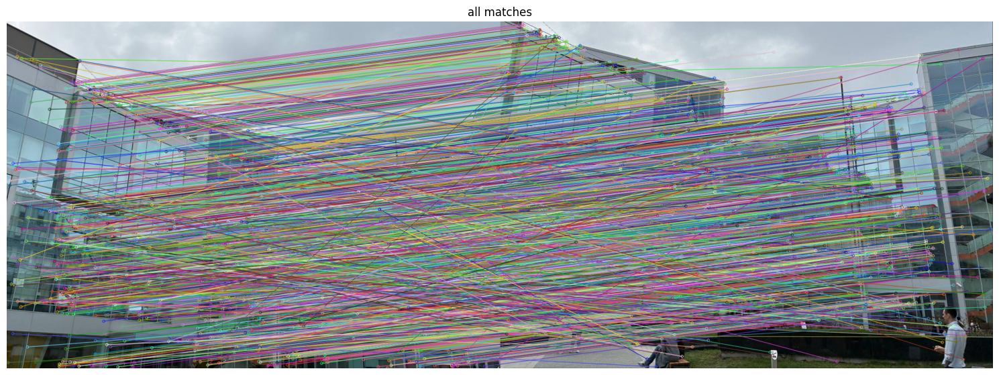

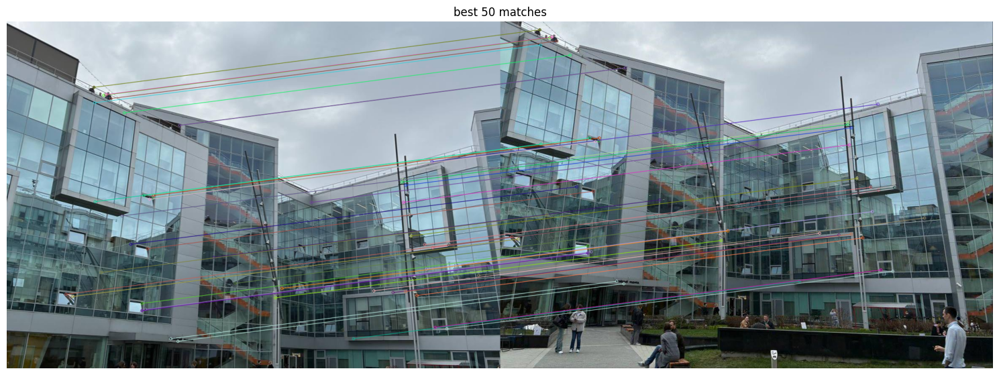

In [14]:
matches_cv = match_key_points_cv(des1, des2)

print(len(matches_cv))
showMatches(image1,kp1,image2,kp2,matches_cv,"all matches")
showMatches(image1,kp1,image2,kp2,matches_cv[:50],"best 50 matches")

Ваша задача: реализовать аналог `BFMatcher`, используя чистый `numpy`. Он основан на подсчете разницы между дескрипторами изображений и вычисляется следующим образом:

1. Подсчет матрицы попарных расстояний между дескрипторами обоих изображений.
2. Для каждого дескриптора изображения 1 находится наиболее похожий (ближайший) дескриптор изображения 2.
2. Для каждого дескриптора изображения 2 находится наиболее похожий (ближайший) дескриптор изображения 1.
4. Те пары дескрипторов, которые совпали (т.е. дескрипторы ближайшие друг для друга) считаются парами.

Шаблоны кода написаны ниже. 

In [15]:
import numpy as np
# do not change the code in the block below
# __________start of block__________
class DummyMatch:
    def __init__(self, queryIdx, trainIdx, distance):
        self.queryIdx = queryIdx  # index in des1
        self.trainIdx = trainIdx  # index in des2
        self.distance = distance
# __________end of block__________


def match_key_points_numpy(des1: np.ndarray, des2: np.ndarray) -> list:
    """
    Match descriptors using brute-force matching with cross-check.

    Args:
        des1 (np.ndarray): Descriptors from image 1, shape (N1, D)
        des2 (np.ndarray): Descriptors from image 2, shape (N2, D)

    Returns:
        List[DummyMatch]: Sorted list of mutual best matches.
    """
    matches = []
    
    if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
        return matches

    dists = np.sqrt(((des1[:, np.newaxis, :] - des2[np.newaxis, :, :]) ** 2).sum(axis=2))

    
    # Find the nearest neighbor for each descriptor in des1
    best_match_idx_1 = np.argmin(dists, axis=1)
    best_match_dist_1 = np.min(dists, axis=1)

    # Find the nearest neighbor for each descriptor in des2
    best_match_idx_2 = np.argmin(dists, axis=0)
    best_match_dist_2 = np.min(dists, axis=0)    
    
    # Perform cross-checking
    for i, idx_2 in enumerate(best_match_idx_1):
        if idx_2 < len(best_match_idx_2) and best_match_idx_2[idx_2] == i:
            matches.append(DummyMatch(i, idx_2, best_match_dist_1[i]))

    # Sort the matches by distance
    matches.sort(key=lambda x: x.distance)
    
    return matches

Проверка:

In [16]:

# do not change the code in the block below
# __________start of block__________
def test_numpy_bf_matcher_equivalence(des1, des2):
    # OpenCV BFMatcher
    cv_matches = match_key_points_cv(des1, des2)
    
    # Our matcher
    np_matches = match_key_points_numpy(des1, des2)

    # Compare match indices and distances
    assert len(cv_matches) == len(np_matches), f"Match count mismatch: {len(cv_matches)} vs {len(np_matches)}"

    for idx, (m_cv, m_np) in enumerate(zip(cv_matches, np_matches)):
        assert m_cv.queryIdx == m_np.queryIdx
        assert m_cv.trainIdx == m_np.trainIdx
        assert abs(m_cv.distance - m_np.distance) < 1e-4, f"Distance mismatch on {idx}th match: {m_cv.distance:.4f} vs {m_np.distance:.4f}"

    print("Your numpy implementation matches OpenCV BFMatcher output!")

test_numpy_bf_matcher_equivalence(des1, des2)
# __________end of block__________

Your numpy implementation matches OpenCV BFMatcher output!


Сдайте функцию `match_key_points_numpy` в задачу **BFMatcher** в соревновании.

## Шаг 4 (опциональный): Оценка матрицы гомографии с использованием DLT и RANSAC

Функция cv2.findHomography оценивает гомографию, которая преобразует исходные точки в целевые. При использовании метода RANSAC она устойчива к выбросам. Ниже доступна реализация функции с использованием RANSAC, а также с использованием более простого метода DLT.

Ваша опциональная задача: реализовать DLT на чистом `numpy`.

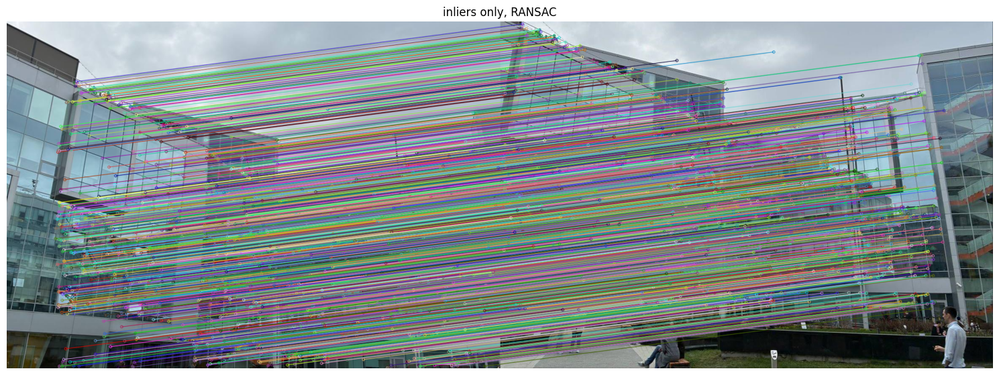

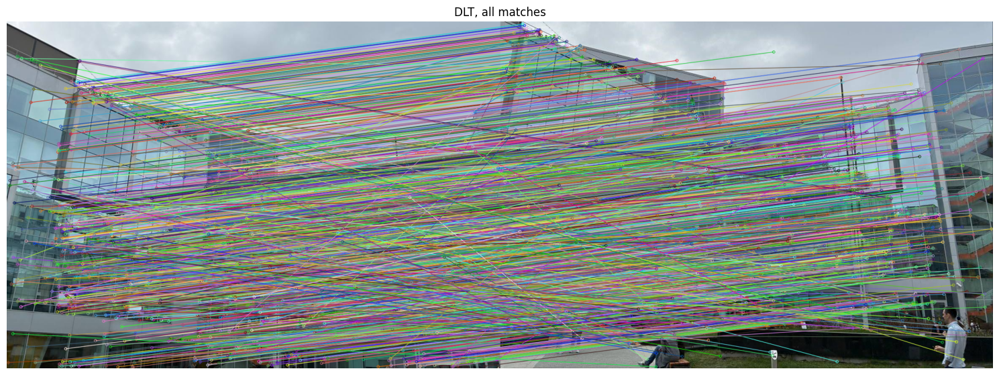

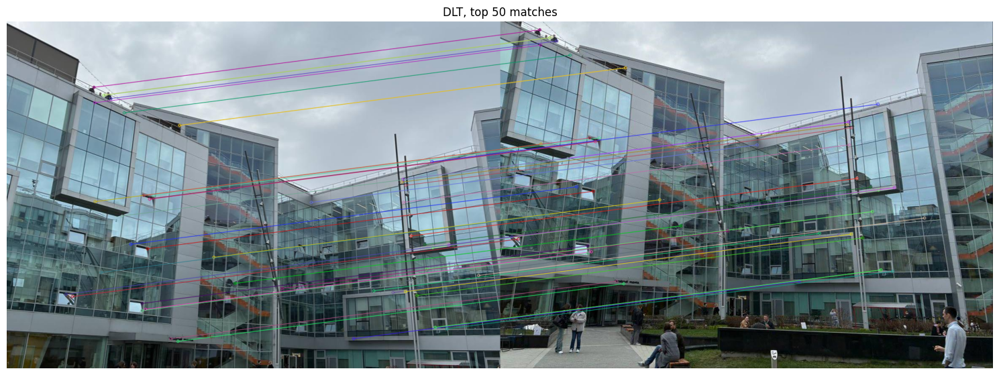

In [17]:
# do not change the code in the block below
# __________start of block__________
def findHomography_dlt_opencv(matches, keypoint1, keypoint2, mode='DLT'):

    src_pts = np.float32([keypoint1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
    dst_pts = np.float32([keypoint2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

    if mode == 'DLT':
        mode = 0
    elif mode == 'RANSAC':
        mode = cv2.RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, mode)
    mask = mask.ravel().tolist()

    inliers = []
    for i in range(len(mask)):
      if mask[i] == 1:
        inliers.append(matches[i])

    return H, inliers


H_for_panorama, inliers = findHomography_dlt_opencv(matches_cv, kp1, kp2, 'RANSAC')
showMatches(image1,kp1,image2,kp2,inliers,"inliers only, RANSAC")


H, inliers = findHomography_dlt_opencv(matches_cv, kp1, kp2, 'DLT')
showMatches(image1,kp1,image2,kp2,inliers,"DLT, all matches")

H, inliers = findHomography_dlt_opencv(matches_cv[:50], kp1, kp2, 'DLT')
showMatches(image1,kp1,image2,kp2,inliers,"DLT, top 50 matches")

# __________end of block__________

Ручная реализация DLT нетривиальна и опциональна. Пример с развернутым описанием и разбором можно найти, например, [здесь](https://medium.com/@insight-in-plain-sight/estimating-the-homography-matrix-with-the-direct-linear-transform-dlt-ec6bbb82ee2b).
Т.к. тонкости реализации могут варьироваться (например, нормировка), оценка похожести матрицы `H`, полученной с помощью вашей реализации и реализации `opencv` достаточно грубая.
Рекомендуем опираться также на визуальную проверку сопоставления изображений ниже.

In [18]:
def dlt_homography_normalized(pts1: np.ndarray, pts2: np.ndarray) -> np.ndarray:
    """
    Computes homography matrix using normalized Direct Linear Transform (DLT).

    Args:
        pts1 (np.ndarray): Source points (N, 2)
        pts2 (np.ndarray): Destination points (N, 2)

    Returns:
        np.ndarray: Homography matrix (3x3)
    """
    # YOUR CODE HERE
    H = None

    return H


def findHomography_dlt_numpy(matches, keypoint1, keypoint2):
    src_pts = np.float32([keypoint1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
    dst_pts = np.float32([keypoint2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)
    return dlt_homography_normalized(src_pts, dst_pts), None




Т.к. DLT неустойчив к выбросам (и вообще достаточно прост), будем использовать `NUM_BEST_MATCHES` лучших совпадений

In [19]:
'''# do not change the code in the block below
# __________start of block__________
NUM_BEST_MATCHES = 50

kp1, des1, kp2, des2 = extract_key_points(*image_dict['example2'])
matches_cv = match_key_points_cv(des1, des2)

H_numpy, _ = findHomography_dlt_numpy(matches_cv[:NUM_BEST_MATCHES], kp1, kp2)
H, _ = findHomography_dlt_opencv(matches_cv[:NUM_BEST_MATCHES], kp1, kp2, mode='DLT')
assert np.allclose(H_numpy, H, atol=2e-1), f"Homography matrices are too different!\nH_numpy:\n{H_numpy}\nH from opencv:\n{H}"
# __________end of block__________'''

'# do not change the code in the block below\n# __________start of block__________\nNUM_BEST_MATCHES = 50\n\nkp1, des1, kp2, des2 = extract_key_points(*image_dict[\'example2\'])\nmatches_cv = match_key_points_cv(des1, des2)\n\nH_numpy, _ = findHomography_dlt_numpy(matches_cv[:NUM_BEST_MATCHES], kp1, kp2)\nH, _ = findHomography_dlt_opencv(matches_cv[:NUM_BEST_MATCHES], kp1, kp2, mode=\'DLT\')\nassert np.allclose(H_numpy, H, atol=2e-1), f"Homography matrices are too different!\nH_numpy:\n{H_numpy}\nH from opencv:\n{H}"\n# __________end of block__________'

## Шаг 5. Построение панорамы
Используя матрицу гомографии `H` можно совместить две фотографии. Функция реализована для вас. Сравните с результатом, полученным вручную на шаге 1.

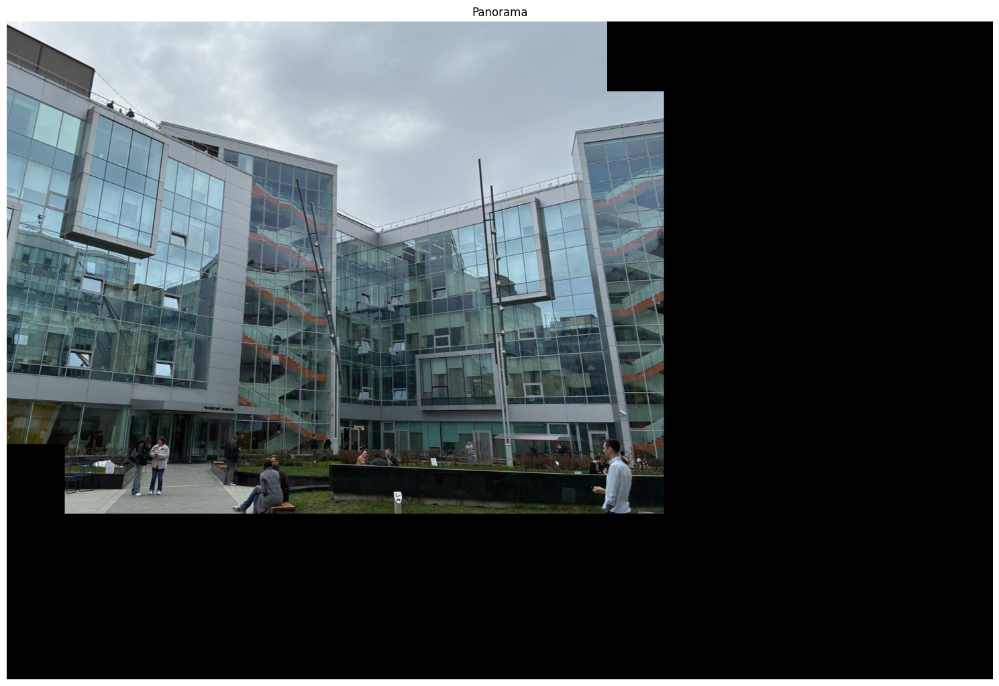

In [20]:
def panorama(img1, img2, H, size):
    img = np.uint8(np.zeros(size))
    img = cv2.warpPerspective(src=img1, dst=img, M=np.eye(3), dsize=(size[1], size[0]))
    img = cv2.warpPerspective(src=img2, dst=img, M=H, dsize=(size[1], size[0]), flags=cv2.WARP_INVERSE_MAP, borderMode=cv2.BORDER_TRANSPARENT)

    return img

size = (1280, 960*2, 3)
imshow([panorama(image1, image2, H_for_panorama, size)],["Panorama"])

## Шаг 6: Функция для построения панорам
Осталось лишь собрать воедино ваши наработки (кроме ручного DLT) и получить функцию, которая на входе имеет два изображения, а на выходе возвращает совмещенное изображение и матрицу `H`.
Благодаря использованию SIFT угол съемки может варьироваться.

Обращаем ваше внимание, даже при правильной реализации на одном из примеров панорама не будет строиться корректно (`example_5`), это нормально.

**Примечание: т.к. вариантов построения данной функции много, для успешного прохождения тестов в контесте используйте следующую последовательность:**
1. Обнаружение ключевых точек с помощью фунции `extract_key_points` с SIFT под капотом (она уже реализована выше).
2. Для сопоставления ключевых точек используйте функцию `match_key_points_cv` (она также реализована).
3. Для определения матрицы гомографии используйте `findHomography_dlt_opencv` с методом `RANSAC` (также реализована).

In [21]:
NUM_BEST_MATCHES = 50

def extract_key_points(img1, img2):
    """
    Detects SIFT keypoints and computes descriptors for two images.

    Args:
        img1 (np.ndarray): First input image.
        img2 (np.ndarray): Second input image.

    Returns:
        tuple: (keypoints1, descriptors1, keypoints2, descriptors2)
    """
    sift = cv2.SIFT.create()

    # Convert images to grayscale if they are not already
    if len(img1.shape) > 2:
        gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    else:
        gray1 = img1

    if len(img2.shape) > 2:
        gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    else:
        gray2 = img2
        
    kpts1, desc1 = sift.detectAndCompute(gray1, None)
    kpts2, desc2 = sift.detectAndCompute(gray2, None)
    return kpts1, desc1, kpts2, desc2

def match_key_points_cv(des1, des2):
    """
    Matches keypoint descriptors using BFMatcher with crossCheck.

    Args:
        des1 (np.ndarray): Descriptors for the first image.
        des2 (np.ndarray): Descriptors for the second image.

    Returns:
        list: Sorted list of DMatch objects.
    """
    bf =  cv2.BFMatcher(crossCheck=True)
    matches = bf.match(des1, des2)

    sorted_matches = sorted(matches, key = lambda x:x.distance)
    return sorted_matches

def findHomography_dlt_opencv(matches, keypoint1, keypoint2, mode='DLT'):
    """
    Calculates the homography matrix using OpenCV's findHomography.

    Args:
        matches (list): List of DMatch objects.
        keypoint1 (list): List of KeyPoint objects for the first image.
        keypoint2 (list): List of KeyPoint objects for the second image.
        mode (str): Method for homography calculation ('DLT' or 'RANSAC').

    Returns:
        tuple: (Homography matrix H, list of inlier matches).
    """
    src_pts = np.float32([keypoint1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
    dst_pts = np.float32([keypoint2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

    if mode == 'DLT':
        cv_mode = 0 # Corresponds to cv2.LMEDS or 0
    elif mode == 'RANSAC':
        cv_mode = cv2.RANSAC
    else:
        raise ValueError("mode must be 'DLT' or 'RANSAC'")
    
    # The contest instructions specifically require RANSAC
    if mode == 'DLT' and cv_mode == 0:
         H, mask = cv2.findHomography(src_pts, dst_pts, cv2.LMEDS) # Use LMEDS if DLT mode explicitly chosen
    else:
         H, mask = cv2.findHomography(src_pts, dst_pts, cv_mode)
    
    if mask is None:
        # Handle cases where findHomography might fail to find a homography
        # (e.g., not enough points, bad points). Return None H and empty inliers.
        return None, []     
         
    mask = mask.ravel().tolist()

    inliers = []
    for i in range(len(mask)):
      if mask[i] == 1:
        inliers.append(matches[i])

    return H, inliers


def panorama_pipeline(img1, img2, size):
    """
    Stitches two images into a panorama using SIFT, RANSAC Homography,
    and OpenCV's warping.

    Args:
        img1 (np.ndarray): The first image (left or source).
        img2 (np.ndarray): The second image (right or destination).
        size (tuple): Desired output canvas size (width, height, channels).

    Returns:
        tuple: (stitched image, homography matrix H mapping img1 to img2's plane).
               Returns (None, None) if homography calculation fails.
    """
    # 1. Обнаружение ключевых точек с помощью SIFT
    kp1, des1, kp2, des2 = extract_key_points(img1, img2)

    # Handle case where descriptors couldn't be computed
    if des1 is None or des2 is None:
        print("Could not detect enough keypoints/descriptors.")
        return None, None
    
    # 2. Сопоставление ключевых точек
    matches_cv = match_key_points_cv(des1, des2)[:NUM_BEST_MATCHES]

    # Handle case where not enough matches are found
    # findHomography requires at least 4 points
    if len(matches_cv) < 4:
        print(f"Not enough matches found ({len(matches_cv)} < 4).")
        return None, None

    # 3. Определение матрицы гомографии с методом RANSAC (обязательно RANSAC)
    # The provided findHomography_dlt_opencv uses RANSAC when mode='RANSAC'
    H, inliers = findHomography_dlt_opencv(matches_cv, kp1, kp2, 'RANSAC')

    # Handle case where homography could not be calculated
    if H is None:
        print("Homography could not be calculated.")
        return None, None

    # YOUR CODE HERE - Stitching the images using H and size
    # The size parameter is expected to be (width, height, channels)
    # cv2.warpPerspective expects size as (width, height)
    output_size = (size[0], size[1])

    # Warp img1 onto a large canvas using the calculated homography H
    # This aligns img1 with the coordinate system of img2
    warped_img1 = cv2.warpPerspective(img1, H, output_size)

    # Now, blend img2 into the warped result.
    # img2 occupies the top-left region of the canvas corresponding to its
    # original dimensions, in the same coordinate system as warped_img1.

    res = warped_img1.copy() # Start with the warped image

    # Get the dimensions of img2
    h2, w2 = img2.shape[:2]

    # Define the region of interest in the result image where img2 will be placed
    # Ensure the region does not exceed the canvas size
    h2_limit = min(h2, size[1])
    w2_limit = min(w2, size[0])

    res_roi = res[0:h2_limit, 0:w2_limit]
    img2_roi = img2[0:h2_limit, 0:w2_limit]

    # Create a mask to identify pixels in the result ROI that are black (from the background)
    # These are the areas where the warped image did not fill, which should be filled by img2
    if len(img2.shape) == 3: # Color image (assuming BGR)
        # A pixel is black if all its color channels are zero
        mask = (res_roi[:,:,0] == 0) & (res_roi[:,:,1] == 0) & (res_roi[:,:,2] == 0)
        # Expand the mask to 3 dimensions to apply to the color image ROI
        mask_3d = np.stack([mask]*3, axis=-1)
        # Copy pixels from img2_roi to res_roi where the mask is True (i.e., where res_roi was black)
        res_roi[mask_3d] = img2_roi[mask_3d]
    else: # Grayscale image
        # A pixel is black if its value is zero
        mask = (res_roi == 0)
        # Copy pixels from img2_roi to res_roi where the mask is True
        res_roi[mask] = img2_roi[mask]

    # The blended result is now in 'res'

    return res, H

In [ ]:
# do not change the code in the block below
# __________start of block__________
size = (1280, 960*2, 3)
h_dict = {}

for filename, (img1, img2) in image_dict.items():
    final_image, H = panorama_pipeline(img1, img2, size)
    h_dict[filename] = H.tolist()
    imshow([final_image],[filename])

with open('h_submission_dict.json', 'w') as iofile:
    json.dump(h_dict, iofile)
# __________end of block__________

Сдайте `h_submission_dict.json` в задачу **Homography mapping**.

## Шаг 7: Ваш telegram login
Запишите ваш telegram login в формате ссылки https://t.me/username в строку ниже. Он будет нужен для участия в тестах.

In [ ]:
your_telegram_login = 'https://t.me/Ackrome'

# do not change the code in the block below
# __________start of block__________
assert your_telegram_login[:13] == 'https://t.me/'
assert '@' not in your_telegram_login

with open('telegram_login.json', 'w') as iofile:
    json.dump([your_telegram_login], iofile)
# __________end of block__________

## Сдача задания
Для сдачи задания вам необходимо:
 * Сдать файл `manual_panorama.json` в задачу **Manual panorama** в соревновании.
 * Сдать функцию `match_key_points_numpy` в задачу **BFMatching** в соревновании.
 * Сдать `h_submission_dict.json` в задачу **Homography mapping**.
 * Сдать `telegram_login.json` в задачу **telegram_login** для участия в тестах.

Не забудьте, что при сдаче кода все импортируемые библиотеки также должны вставляться вместе с вашим кодом. Вы не должны использовать что-либо, кроме `numpy` при написании решения.

На этом задание завершено. Поздравляем!